In [1]:
import torch
import torch.nn as nn
import torch.nn.init as init
from torch.utils.data import TensorDataset, DataLoader
from torchviz import make_dot
from torchsummary import summary

import numpy as np
import matplotlib.pyplot as plt
import japanize_matplotlib
import re

from sklearn import svm
from sklearn.model_selection import train_test_split

import glob
import os
import time
import sys
import wandb
import json
from tqdm.notebook import tqdm

sys.path.append("/home/cygnus/fujimoto/Cygnus-X_CAE/Cygnus-X_cloud/models")
from CAE import model_layer9_BatchNorm_no_center as model

/usr/local/lib/python3.10/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

In [2]:
print(os.getcwd())

/home/cygnus/fujimoto/Cygnus-X_CAE/analysis/check_model


In [3]:
class DataSet():
    def __init__(self, data, label):
        self.label = label
        self.data = data
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        return self.data[index], self.label[index]

In [4]:
api = wandb.Api()
artifact_path = 'yudai22-/condition_matching/training_log:v5'
artifact = api.artifact(artifact_path)
artifact_dir = artifact.download()

print("Downloaded to:", artifact_dir)

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

  ········


wandb: Currently logged in as: yudai22 (yudai22-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Downloading large artifact 'training_log:v5', 67.62MB. 1 files...
wandb:   1 of 1 files downloaded.  
Done. 00:00:00.7 (100.3MB/s)


Downloaded to: /home/cygnus/fujimoto/Cygnus-X_CAE/analysis/check_model/artifacts/training_log:v5


In [5]:
run = artifact.logged_by()


try:
    config_dict = json.loads(run.config)
    latent = config_dict["latent_num"]
    print(latent)
except json.JSONDecodeError:
    # run.config が有効なJSON文字列でなかった場合の処理
    print("エラー: run.config は有効なJSON形式ではありません。")
except TypeError:
    # run.config が文字列でなかった場合の処理 (念のため)
    print("エラー: run.config は文字列型ではありません。")


latent = latent["value"]
# print(latent)

match = re.findall('/.*/', artifact_path)
log_name = re.search(r"(training.*)", artifact_path).group()

print(log_name)
print(match[0][1:-1])

{'value': 100}
training_log:v5
condition_matching


In [6]:
weight_path = f"{artifact_dir}/model_parameter.pth"
weight_para = torch.load(weight_path, map_location=torch.device('cpu'))

In [7]:
# latent = 100

In [8]:
print(latent)

100


In [9]:
model = model.Conv3dAutoencoder(latent)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

In [10]:
model.load_state_dict(weight_para)
model.to(device)
model.eval()

Conv3dAutoencoder(
  (encoder): Sequential(
    (0): Conv3d(1, 32, kernel_size=(4, 4, 4), stride=(2, 2, 2), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv3d(32, 32, kernel_size=(4, 4, 4), stride=(2, 2, 2), padding=(1, 1, 1))
    (4): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (7): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (10): ReLU(inplace=True)
    (11): Conv3d(64, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1))
    (12): ReLU(inplace=True)
    (13): Flatten(start_dim=1, end_dim=-1)
    (14): Linear(in_features=84640, out_features=100, bias=True)
  )
  (decoder): Sequential(
    (0): 

In [11]:
summary(model.to(device), (1, 30, 100, 100))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv3d-1       [-1, 32, 15, 50, 50]           2,080
       BatchNorm3d-2       [-1, 32, 15, 50, 50]              64
              ReLU-3       [-1, 32, 15, 50, 50]               0
            Conv3d-4        [-1, 32, 7, 25, 25]          65,568
       BatchNorm3d-5        [-1, 32, 7, 25, 25]              64
              ReLU-6        [-1, 32, 7, 25, 25]               0
            Conv3d-7        [-1, 64, 7, 25, 25]          55,360
       BatchNorm3d-8        [-1, 64, 7, 25, 25]             128
              ReLU-9        [-1, 64, 7, 25, 25]               0
           Conv3d-10        [-1, 64, 7, 25, 25]         110,656
             ReLU-11        [-1, 64, 7, 25, 25]               0
           Conv3d-12        [-1, 32, 5, 23, 23]          55,328
             ReLU-13        [-1, 32, 5, 23, 23]               0
          Flatten-14                [-1

In [12]:
#dataには学習データのpathを入力する
data = np.load("/home/cygnus/fujimoto/Cygnus-X_CAE/data/zroing_resize_data/resize_data/condition_match/one_size/CygnusX_cut_one_size_mode_percentile_100x100.npy")
print(len(data))
data = torch.from_numpy(data).float()
label = [0]*len(data)

train_data, val_data, train_labels, val_labels = train_test_split(data, label, test_size=0.2, random_state=42, stratify=label)
print(type(train_data))
val_data, test_data, val_labels, test_labels = train_test_split(val_data, val_labels, test_size=0.25, random_state=42, stratify=val_labels)

train_dataset = DataSet(train_data, train_labels)
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True)

val_dataset = DataSet(val_data, val_labels)
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=False)

test_dataset = DataSet(test_data, test_labels)
test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False)

1389
<class 'torch.Tensor'>


In [13]:
print(test_dataset[0][0].shape)

torch.Size([30, 100, 100])


In [14]:
import re

match = re.findall('/.*/', artifact_path)
log_name = artifact_path.split("/")[-1]

print(log_name)
print(match[0][1:-1])

if os.path.exists(f"./saved_pictures/{match[0][1:-1]}/{log_name}_output_images/all"):
    pass
else:
    os.makedirs(f"./saved_pictures/{match[0][1:-1]}/{log_name}_output_images/all")

training_log:v5
condition_matching


In [15]:
model.to(device)

output_list = []
for images, labels in tqdm(test_dataloader):
    images = images.view(-1, 1, 30, 100, 100)  # バッチサイズを維持したままチャンネル数を1に設定
    with torch.set_grad_enabled(True):
            
        # モデルの出力を計算する
        output = model(images.clone().to(device))
        output = output.squeeze()
        output_list.append(output.to("cpu").detach().numpy().copy())

  0%|          | 0/9 [00:00<?, ?it/s]

In [16]:
output_list = np.concatenate(output_list)

In [17]:
print(len(output_list))
print(len(data))

70
1389


In [18]:
num_index = np.random.randint(1, len(output_list), size=10)
num_index = list(num_index)
num_index.sort()
print(num_index)

[8, 25, 28, 29, 32, 33, 38, 38, 64, 69]


In [19]:
num_index = [6, 13, 19, 26, 31, 35, 44, 62, 65, 67]
# num_index = [31, 47, 68, 69, 89]

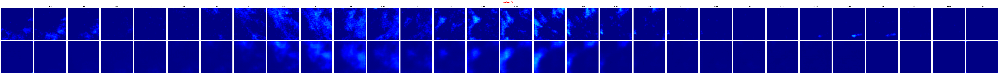

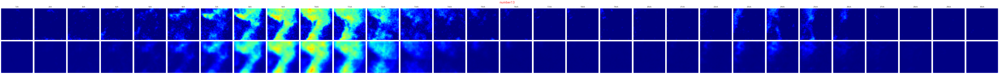

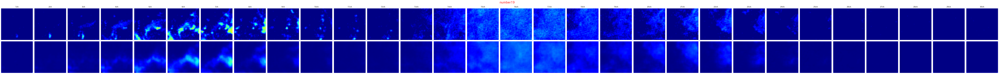

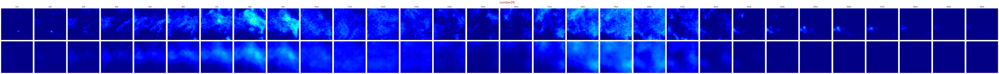

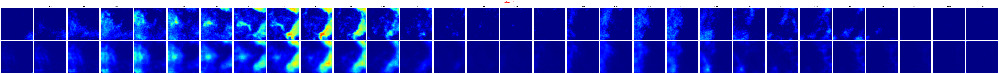

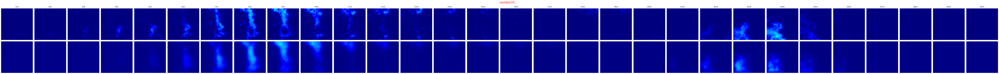

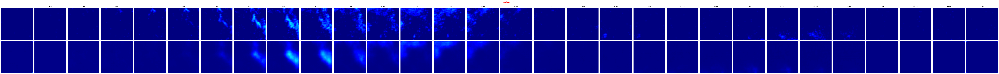

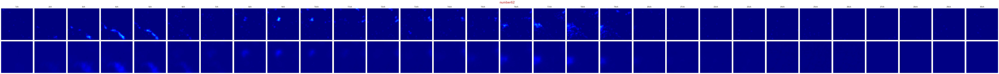

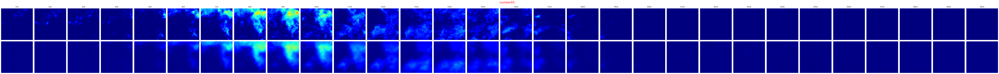

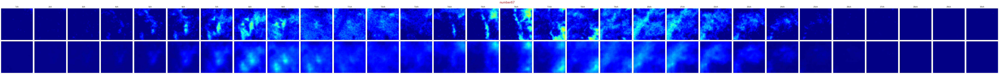

In [20]:
for i in num_index:
    image1 = test_data[i]
    image2 = output_list[i]

    fig, axes = plt.subplots(2, len(image1), figsize=(3*len(image1), 7))
    for j in range(len(image1)):
        axes[0, j].imshow(image1[j, :, :], vmin=0, vmax=1, cmap="jet")
        axes[0, j].axis('off')
        axes[0, j].set_title(f"{j+1}ch")
    
        axes[1, j].imshow(image2[j, :, :], vmin=0, vmax=1, cmap="jet")
        axes[1, j].axis('off')

    fig.suptitle(f"number{i}", x=0.5, y=0.98, ha='left', fontsize=20, color="r")
    plt.tight_layout()
    plt.savefig(f"./saved_pictures/{match[0][1:-1]}/{log_name}_output_images/all/{log_name}_出力結果{i}.png", format="png", dpi=50)
    plt.show()

In [21]:
np.random

<module 'numpy.random' from '/usr/local/lib/python3.10/dist-packages/numpy/random/__init__.py'>

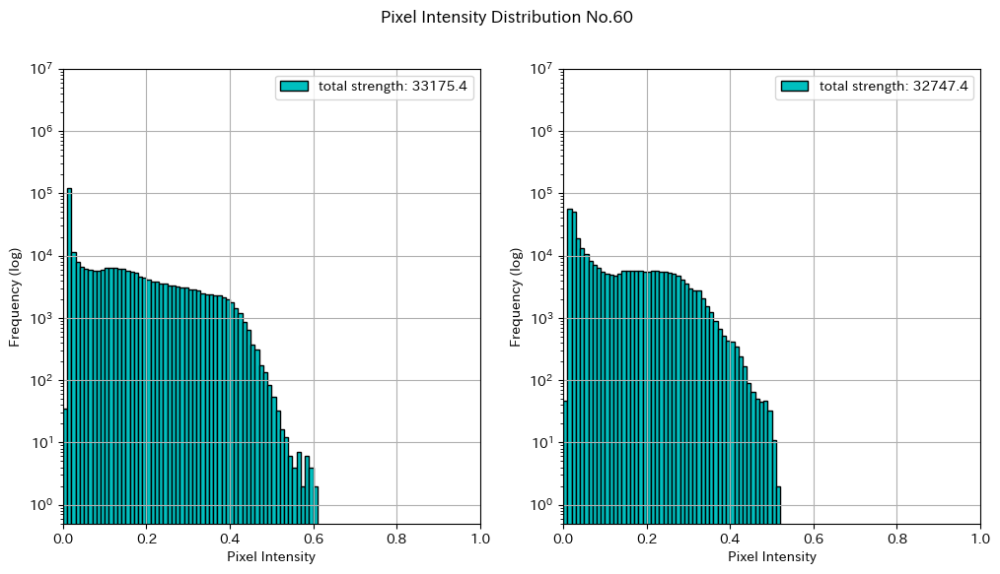

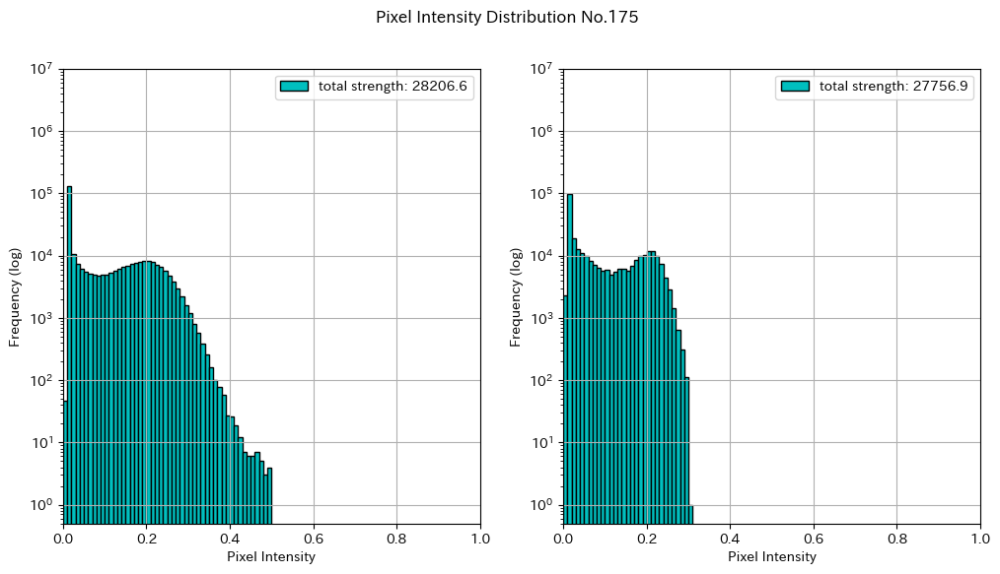

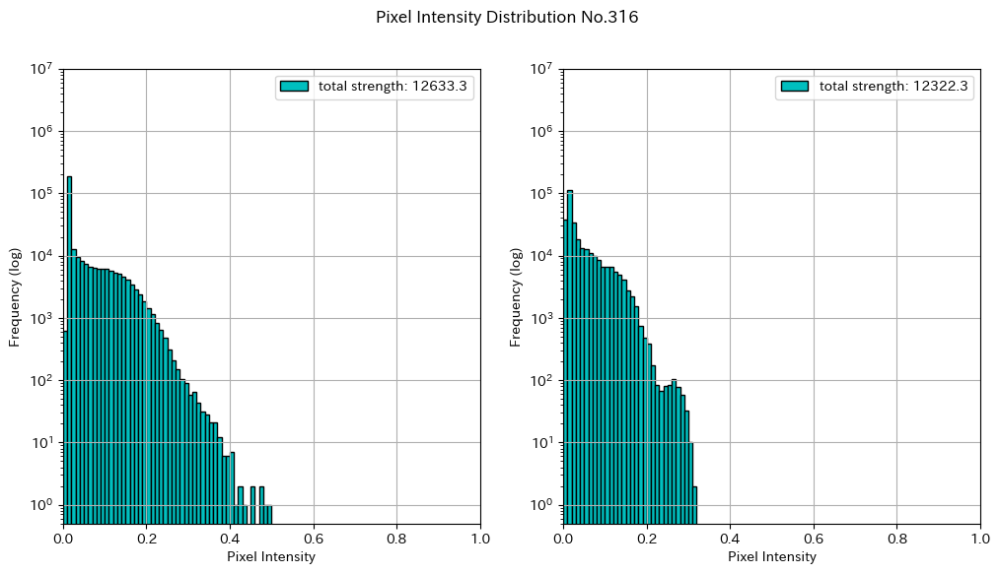

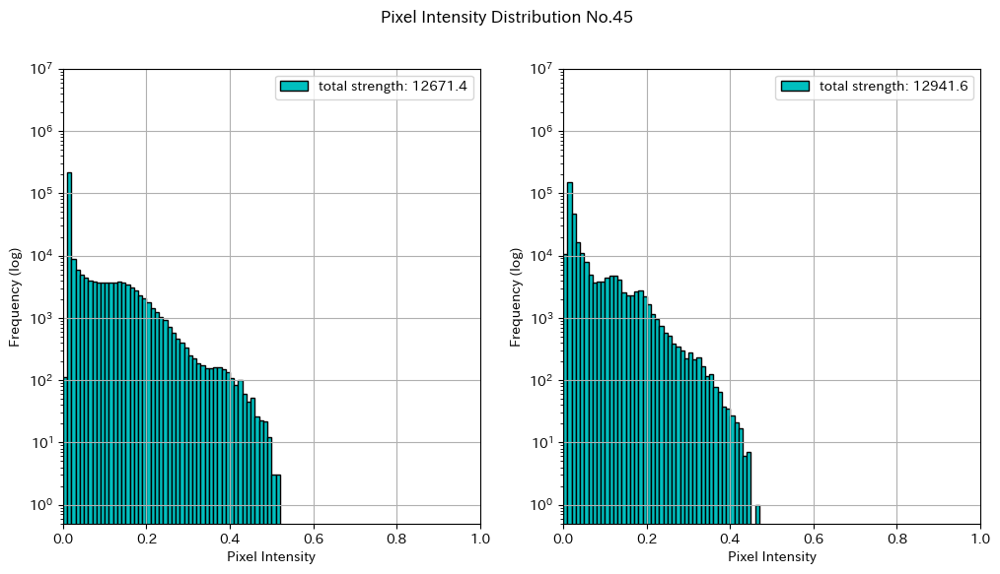

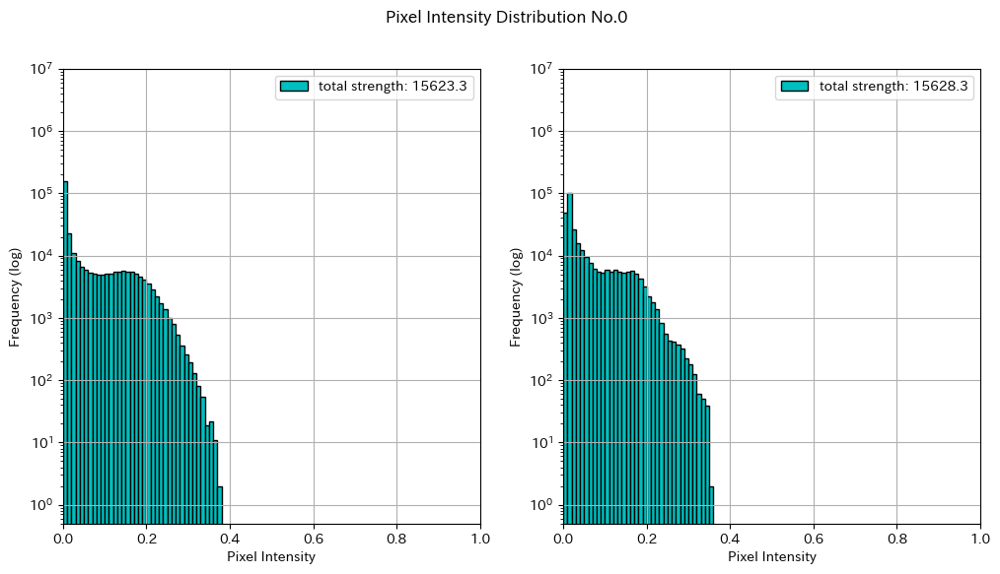

...

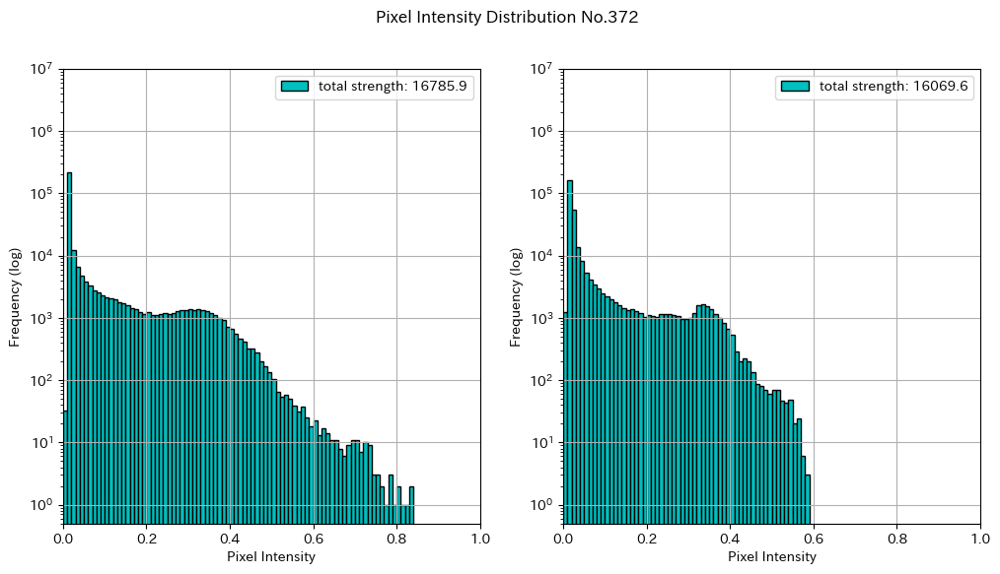

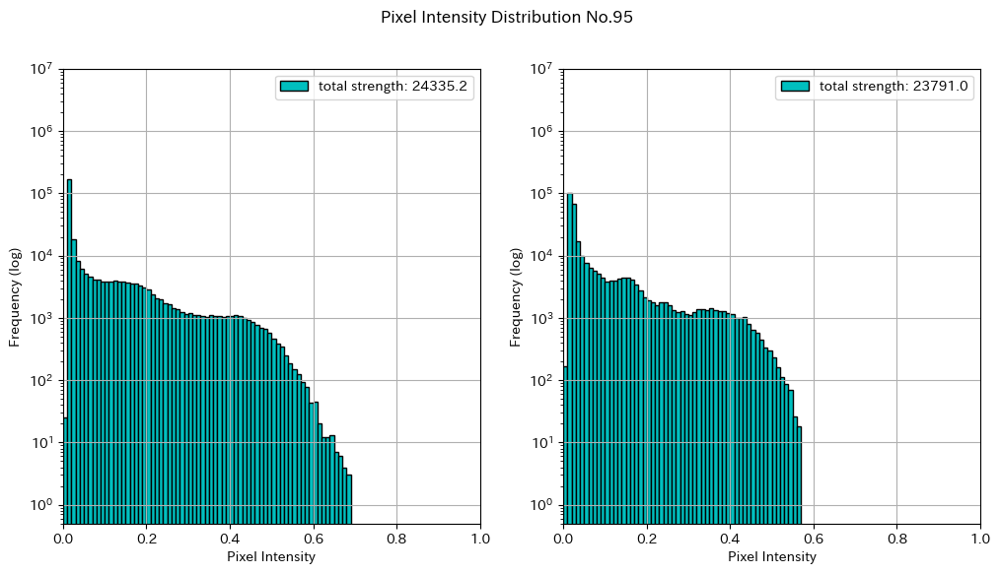

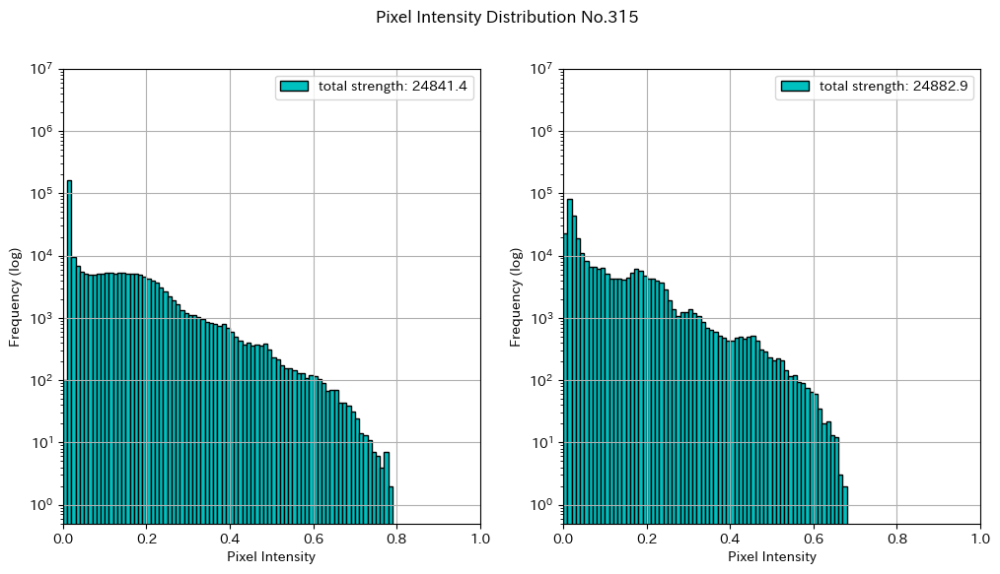

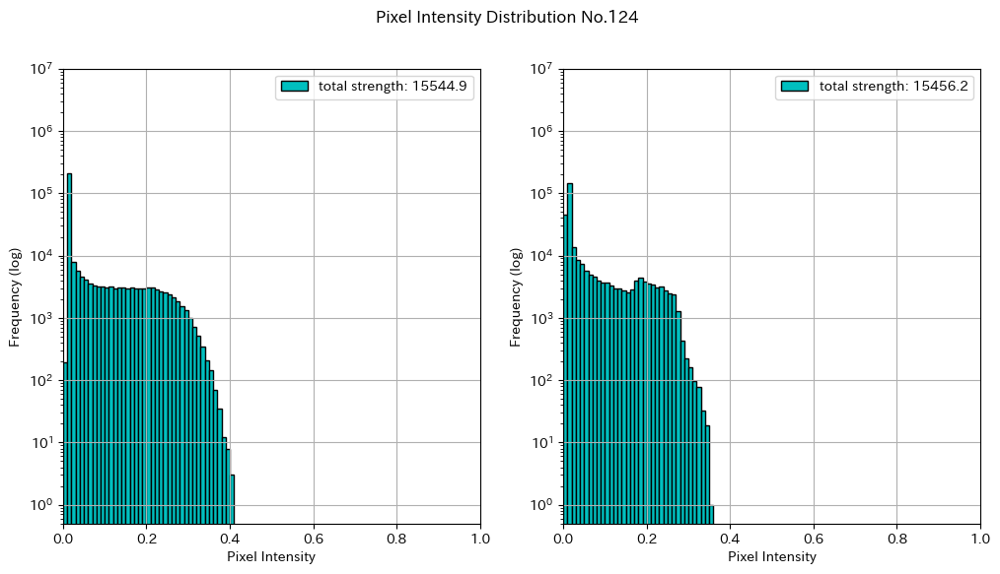

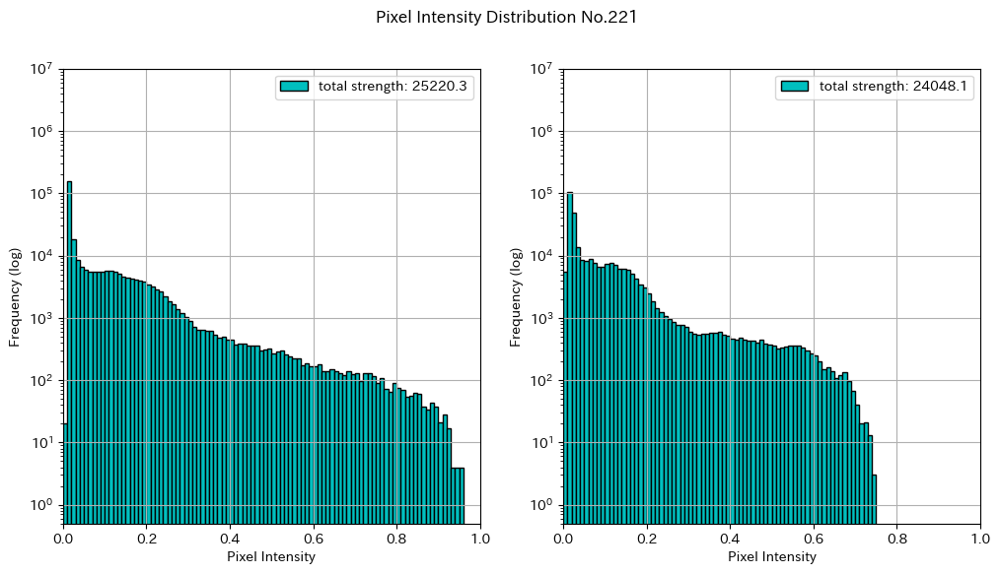

In [21]:
bins = 100  # ビンの数
hist_list = np.random.choice(len(test_data), size=20)
for i in hist_list:
    flattened_test_data = test_data[i].flatten()
    flattened_out_data = output_list[i].flatten()
    
    test_hist, test_edges = np.histogram(flattened_test_data, bins=bins, range=(0, 1))
    out_hist, out_edges = np.histogram(flattened_out_data, bins=bins, range=(0, 1))
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].set_yscale('log')  # y軸をログスケールに設定
    axes[0].bar(test_edges[:-1], test_hist, width=np.diff(test_edges), color="c", edgecolor='black', align='edge')
    axes[0].set_xlabel("Pixel Intensity")
    axes[0].set_ylabel("Frequency (log)")

    axes[0].legend([f'total strength: {flattened_test_data.sum():.1f}'])
    axes[0].set_xlim(0, 1)
    axes[0].set_ylim(0.5, 1e7)
    axes[0].grid(True)
    
    axes[1].set_yscale('log')  # y軸をログスケールに設定
    axes[1].bar(out_edges[:-1], out_hist, width=np.diff(out_edges), color="c", edgecolor='black', align='edge')
    axes[1].set_xlabel("Pixel Intensity")
    axes[1].set_ylabel("Frequency (log)")
    
    axes[1].legend([f'total strength: {flattened_out_data.sum():.1f}'])
    axes[1].set_xlim(0, 1)
    axes[1].set_ylim(0.5, 1e7)
    axes[1].grid(True)

    plt.suptitle(f"Pixel Intensity Distribution No.{i}")
    # plt.savefig(f"input_output_hist_{i}")
    plt.show()

In [22]:
!pwd

/home/cygnus/fujimoto/Cygnus-X_CAE/analysis/check_model


In [23]:
latent_save_dir = f"/home/cygnus/fujimoto/Cygnus-X_CAE/analysis/check_latent/latent_list/{match[0][1:-1]}"
print(latent_save_dir)

if os.path.exists(latent_save_dir):
    pass
else:
    os.makedirs(latent_save_dir)

/home/cygnus/fujimoto/Cygnus-X_CAE/analysis/check_latent/latent_list/condition_matching


In [24]:
print(f"{latent_save_dir}/{log_name}_latent.npy")

/home/cygnus/fujimoto/Cygnus-X_CAE/analysis/check_latent/latent_list/condition_matching/training_log:v5_latent.npy


In [25]:
# CAEのエンコーダ部分から潜在変数を抽出する
# non_aug_data = "FUGIN_CAE_projects/FUGIN_CAE/120_layers/data/CygnusX_layer120_1946.npy"
all_dataset = DataSet(data, label)
all_dataloader = DataLoader(all_dataset, batch_size=8, shuffle=False)

latent_list = []
for images, labels in tqdm(all_dataloader):
    # 画像をモデルに入力するために正しいデバイスに移す
    images = images.view(-1, 1, 30, 100, 100)
    images = images.to(device)

    with torch.no_grad():  # 勾配計算は不要
        # エンコーダ部分のみの出力を取得（潜在変数）
        latent_output = model.encoder(images)

        # 潜在変数をリストに追加 (CPUに戻し、numpy形式に変換)
        latent_list.append(latent_output.cpu().detach().numpy())

# 潜在変数のリストを1つの配列に結合
latent_array = np.concatenate(latent_list, axis=0)
np.save(f"{latent_save_dir}/all/{log_name}_all_latent.npy", latent_array)

  0%|          | 0/174 [00:00<?, ?it/s]

In [26]:
latent_array.shape

(1389, 100)

In [29]:
import numpy as np

In [2]:
latent_list = np.load("/home/filament/fujimoto/Cygnus-X_CAE/analysis/check_latent/latent_list/condition_matching/bubble/training_log:v3_bubble_latent.npy")

In [9]:
print('{:.2f}'.format(list(latent_list)))

TypeError: unsupported format string passed to list.__format__